# MTH3302: Méthodes probabilistes et statistiques pour l'I.A.
#### École Polytechnique de Montréal
#### 25 avril 2023


## Projet H2023

- Vincent Haney
- Félix Pelletier
- Charles-François St-Cyr
- Mikael Vaillant

# Prédiction du prix des diamants

### 0. Librairies

In [205]:
using CSV, DataFrames, Distributions, Gadfly, MLBase, Random, Statistics, Colors, GLM, LinearAlgebra, Combinatorics, CategoricalArrays,Distances,NearestNeighbors

include("./library/main.jl");
include("./library/normalize.jl");
include("./library/missing-values.jl");

### 1. Introduction

#### 1.1 Contexte

Le marché des pierres préciseuses engendre des transferts de grands volumes d'argent. Bien que le prix de ces cailloux dépende de plusieurs facteurs bien définis, d'autres sources d'incertitude peuvent causer des différences dans l'estimation du prix, que ce soit un biais de la personne qui évalue, des données manquantes ou des caractéristiques traduites incorrectement.

#### 1.2 Objectif

À partir d'un ensemble de données, l'objectif est de concevoir un modèle de prédiction du prix de diamants à partir des caractéristiques qui sont fournies. Pour évaluer la validité des prédictions, il s'agit de **minimiser la valeur du RMSE entre les prédictions du prix et le prix réel** d'un ensemble de diamants.

### 2. Visualisation des données

#### 2.1. Présentation des données

Les données fournies sont distribuées sur deux ensembles :
 - `train.csv` : Ensemble d'entraînement, avec les caractéristiques et le prix de 40 455 diamants
 - `test.csv` : Ensemble de tests, avec les caractéristiques de 13 485 diamants

 Notons que du bruit a été ajouté aux données afin de le rendre unique.

Les variables explicatives fournies sont les suivantes:
- cut : qualité de coupe (Fair, Good, Very Good, Premium, Ideal)
- color : couleur du diamant (de J (pire) à D (meilleure))
- clarity : clarté du diamant (I1 (pire), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (meilleure))
- x: longueur en mm 
- y: largeur en mm
- z: profondeur en mm
- depth: pourcentage de la profondeur exprimée comme $2\frac{z}{(x+y)}$
- table: pourcentage de la largeur du sommet du diamant par rapport au point le plus large

La variable à prédire est la suivante:
 - price: prix du diamant

 
 ###### Source: https://www.kaggle.com/competitions/prix-des-diamants2/data

#### 2.2. Chargement des données pour la visualisation 

Un échantillon de 5000 données sera utilisé afin d'alléger l'affichage tout en conservant les tendances du jeu de données.

In [206]:
base_data = CSV.read("./data/train_light.csv", DataFrame);

first(base_data, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z
,Int64,String15?,String1,String7,Float64?,Float64,Int64,Float64,Float64?,Float64
1,1,missing,E,SI2,60.2,60.0,5340,6.46,6.5,3.9
2,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19
3,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67
4,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71
5,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02


#### 2.3. Visualisation de la taille

Nous observons d'abord le prix en fonction de la taille pour chacunes des pierres. On remarque qu'il semble y avoir des classes de prix selon certaines dimensions. Ceci nous laisse croire qu'il y a d'autres paramètres qui influencent le prix. C'est ce que nous allons tenter de découvrir.

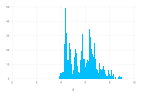

In [207]:
plot(base_data, x = :x, Geom.histogram) 

#### 2.4. Comparaison des valeurs de tailles ($X$, $Y$, $Z$)

Nous examinons la relation entre $X$, $Y$ et $Z$. À première vue, ces données sont fortement corrélées en présentant deux droites linéaires. Ainsi, notre modèle devrait n'inclure qu'une seule de ces variables pour les couples (x,y) et (x,z).

De plus, nous voyons plusieurs données qui semblent anormales.

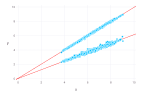

In [208]:
reg_y = GLM.lm(GLM.@formula(y ~ x), base_data)
reg_z = GLM.lm(GLM.@formula(z ~ x), base_data)
plot(base_data, 
    layer(x=:x, y=:y, Geom.point, intercept = [GLM.coef(reg_y)[1]],  slope = [GLM.coef(reg_y)[2]] , Geom.abline(color="red")),
    layer(x=:x, y=:z, Geom.point, intercept = [GLM.coef(reg_z)[1]],  slope = [GLM.coef(reg_z)[2]] , Geom.abline(color="red")))

#### 2.5. Comparaison de $table$ et $depth$

On observe que ces deux variables ne sont pas complètement indépendantes. Les valeurs de $depth$ semblent diminuer légèrement lorsque les valeurs de $table$ augmentent. Cependant, cette corrélation est plutôt faible et il reste de l'information à tirer de ces deux variables.

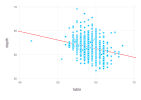

In [209]:
reg = GLM.lm(GLM.@formula(depth ~ table), base_data)
plot(base_data, x = :table, y = :depth, Geom.point, intercept = [GLM.coef(reg)[1]], slope = [GLM.coef(reg)[2]] , Geom.abline(color="red"))

#### 2.6. Comparaison de $X$, $Y$ et $Z$ par rapport au coût

On constate que les tailles sont corrélées au prix : plus le prix augmente, plus la taille augmente.

De plus, pour chaque point de donnée, $X$ et $Y$ sont presque égaux. C'est la tendance qui semble se confirmer lorsqu'on analyse les données numériques et le contexte.

On observe aussi quelques données aberrantes, dont des tailles égales à $0$.

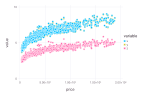

In [210]:
plot(stack(base_data, [:x, :y, :z]), x = :price, y = :value, color = :variable)

#### 2.7. Comparaison de $table$ et $depth$ par rapport au coût

À première vue, ces variables ne semblent pas être les meilleures variables explicatives étant donné que la valeur semble être environ la même pour tous les prix, à l'exception de quelques valeurs aberrantes.

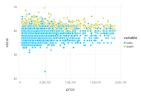

In [211]:
plot(stack(base_data, [:table, :depth]), x = :price, y = :value, color = :variable)

### 3. Détection de la colinéarité

Dans la section 2, nous avons constaté qu'il existe probablement de la colinéarité entre certaines variables explicatives. Par conséquent, nous allons utiliser le VIF. Le VIF pour une variable $A$ est défini comme suit :

$$
VIF_A = \frac{1}{1 - R^2_A}
$$

Où $R^2_A$ est le coefficient de détermination obtenu lorsque $A$ est régressé par rapport aux autres variables explicatives. Une variable est considérée comme étant colinéaire si son coefficient de variabilité interne (VIF) est supérieur à 10.

Comme prévu, les variables $x$, $y$ et $z$ sont colinéaires. On constate également que $depth$ et certaines $clarity$ sont aussi colinéaires.

In [212]:
data = deepcopy(base_data)

convertQualitativeToQuantitative(data, :color)
convertQualitativeToQuantitative(data, :cut)
convertQualitativeToQuantitative(data, :clarity)

color_names = getNamesForQuantitative(data, :color)
cut_names = getNamesForQuantitative(data, :cut)
clarity_names = getNamesForQuantitative(data, :clarity)

sort!(
    getAllVIF(data, ["x", "y", "z", "table", "depth", color_names..., cut_names..., clarity_names...]),
    :VIF,
    rev = true,
)

Row,Variable,VIF
,String,Float64
1,z,2243.14
2,y,1251.1
3,x,1100.96
4,depth,35.6902
5,cut: Ideal,10.8857
6,clarity: SI1,10.258
7,clarity: VS2,9.68745
8,clarity: SI2,8.01646
9,cut: Premium,7.79843


### 4. Valeurs suspicieuses

Dans la section 2, nous avons remarqué la présence de valeurs aberrantes. Parmis celle-ci, on retrouve des données dont certaines valeurs sont manquantes ou dont les valeurs sont anormales. Examinons les données afin de déterminer celles-ci.

#### 4.1 Chargement des données réelles pour l'identification de données aberrantes 

In [213]:
base_data_reel = CSV.read("./data/train.csv", DataFrame);
base_data_test = CSV.read("./data/test.csv", DataFrame);
data = deepcopy(base_data_reel);
test = deepcopy(base_data_test);

#### 4.2 Vérification des données

##### 4.2.1 Valeurs manquantes: 

On remarque que beaucoup de valeur sont manquantes pour les variables "cut", "depth" et "y". Or, elles ont quand même un prix. 

Il faut donc trouver un moyen d'estimer une valeur pour ces variables afin de pouvoir donner une prédiction adéquate dans le cas où cette même valeur soit manquante dans l'ensemble de validation.

##### 4.2.1 Ensemble d'entraînement

On remarque que l'ensemble d'entraînement a des valeurs manquantes pour les variables explicatives *cut*, *depth* et *y*. En somme, on a environ 20% des lignes du jeu de données   qui conteinnent des valeurs manquantes.

In [214]:
data_missing_counts = collect(count(ismissing, col) for col in eachcol(data))
data_zero_counts = (hcat([0,0,0,0]',hcat([count(x -> x < 0.05, skipmissing(data[:, col])) for col in [:depth,:table,:price,:x, :y, :z]]...)))'[:, 1]

DataFrame(Variables = names(data), DataMissing = data_missing_counts, DataZero = data_zero_counts)

Row,Variables,DataMissing,DataZero
,String,Int64,Int64
1,ID,0,0
2,cut,3806,0
3,color,0,0
4,clarity,0,0
5,depth,2201,13
6,table,0,0
7,price,0,0
8,x,0,4
9,y,2200,3


##### 4.2.2 Ensemble de test

On remarque que l'ensemble de test possède des valeurs manquantes dans les mêmes variables explicatives que l'ensemble d'entraînement. La même proportion de données manquantes est conservée pour l'ensemble de test, soit environ 20%.

In [215]:

test_missing_counts = collect(count(ismissing, col) for col in eachcol(test))
test_zero_counts = (hcat([0,0,0,0]',hcat([count(x -> x < 0.05, skipmissing(test[:, col])) for col in [:depth,:table,:x, :y, :z]]...)))'[:, 1]

DataFrame(Variables = names(test), DataMissing = test_missing_counts, DataZero = test_zero_counts)

Row,Variables,DataMissing,DataZero
,String,Int64,Int64
1,ID,0,0
2,cut,1194,0
3,color,0,0
4,clarity,0,0
5,depth,800,5
6,table,0,0
7,x,0,4
8,y,800,4
9,z,0,5


##### 4.2.3 Observations

Voici les points marquants qui ressortent de cette analyse:

- On retrouve des valeurs manquantes dans les variables $cut$, $depth$ et $y$
- On remarque que les données manquantes en $depth$ et $y$ ont pratiquement aussi nombreuses. Ceci correspond au comportement attendu, car $depth$ est calculé à l'aide de $y$. L'un ne peut être calculé sans l'autre.
- La proportion de données manquantes est la même dans les deux ensembles
- La présence de zéros dans les champs $x$, $y$ et $z$

Il ne faut pas oublier les valeurs nulles : celles-ci ne devrait pas exister dans les variables où elles sont observées ici : $depth$, $x$, $y$ et $z$. Il est toutefois normal que $depth$ présente des valeurs nulles au moins où les valeurs de $z$ sont nulles.

#### 4.3 Valeur aberrantes

En observant les graphiques des sections 2.4 à 2.7 et les tableaux de la section 4.2, on remarque que la grande majorité des valeurs aberrantes provient des valeurs nulles.

En raison du bruit introduit dans les données, nous avons décidé de traiter les valeurs rapprochées de $0$ comme des $0$. Ainsi, la qualification $nulle$ d'une valeur n'est pas attribuée lorsqu'elle est égale à $0$, mais bien lorsque celle-ci est plus petite qu'un seuil, ici fixé à $0.05$. Ce seuil a été choisi en analysant les données, où il a été constaté que toutes les valeurs suspicieusement près $0$ y sont inférieures.

#### 4.4 Gestion des valeurs suspicieuses

Nous savons que l'ensemble de test contient des données suspicieuses. Afin de nous permettre de tirer des conclusions sur celles-ci, nous avons envisagé deux solutions: 
- Diviser l'analyse en deux partie: Les données complètes et les données incomplètes
- Remplacer les valeurs par des estimations


##### 4.4.1 Division de l'analyse

Dans le cas présent, on remarque une population de données manquantes assez grande. Ainsi, on pourrait construire deux modèles: un modèle pour les données complètes et un pour les données incomplètes.

On devrait alors vérifier comment les populations de données manquantes se divisent. Par exemple, est-ce que les données manquantes pour $depth$ et $y$ sont mutuellement exclusives avec les données manquantes de $cut$.

In [216]:
overlap = subset(data, :x => ByRow(<=(0.5)))

Row,ID,cut,color,clarity,depth,table,price,x,y,z
,Int64,String15?,String1,String7,Float64?,Float64,Int64,Float64,Float64?,Float64
1,1906,missing,G,VS1,-0.0,67.0,6381,-0.0,-0.01,0.0
2,7738,Ideal,F,SI2,0.0,56.0,4954,0.02,6.59,0.0
3,14682,Premium,H,SI2,-0.0,59.0,18034,0.01,-0.02,0.0
4,17867,Ideal,G,VS2,missing,54.0,12799,0.0,-0.0,0.0


On remarque alors rapidement (ligne 1906) qu'il y a des sous-ensembles possibles existants dans cette solution. Afin de générer des sous-ensembles de données parmis l'ensemble des données incomplètes, il faudrait procéder à un remplacement de données. Nous allons implémenter celui-ci et tester le besoin de sous diviser l'analyse initiale. 

#### 4.4.2 Remplacement des valeurs

Le remplacement de valeurs nous permettra de traiter des données ou de rassembler des sous-ensembles de division à l'aide de valeur plausibles.

Tel que présenté dans le tableau nous avons deux catégories de données manquantes:
- $cut$
- $depth$ et les dimensions $x$, $y$ et $z$

Les différentes méthodes ont été utilisées dans les différentes régressions de la sections suivante. Les méthodes utilisées sont celles qui se sont avérées les plus performantes selon leur modèle respectif.

#### 4.4.3 Remplacement de $cut$

Plusieurs avenues ont été explorées dans le cas de la variable $cut$ :

D'abord, si l'on souhaite avoir une valeur qualitative spécifique, les valeurs manquantes peuvent être remplies par le mode des données fournies. Ceci permet donc de travailler avec la valeur la plus probable de la variable. Un défaut de cette stratégie est que l'on assume que les valeurs de $cut$ sont indépendantes des autres variables. Considérant que la valeur des diamants dépend de plusieurs caractéristiques, il ne serait pas surprenant qu'une coupe plus minutieuse soit faite pour des diamants plus gros, ou de meilleure clarté. Par souci de simplicité, l'utilisation du mode restera la méthode privilégiée pour donner une valeur qualitative. Une analyse de la coupe par tranche de quartile pour la dimension $X$ permet de vérifier cette hypothèse. Le code ci-dessous permet d'émettre un jugement sur la distribution de $cut$ selon $x$ :

In [217]:
# Décompte de chaque coupe dans l'ensemble des données
c = countmap(data[:, :cut])
DataFrame(Valeur = [keys(c)...], Décompte = [values(c)...])

Row,Valeur,Décompte
,String15?,Int64
1,Ideal,14610
2,Good,3381
3,Fair,1081
4,Premium,9370
5,missing,3806
6,Very Good,8207


In [218]:
# Décompte de chaque coupe dans les quartiles 20 à 30% de X
q1 = quantile(data[:,:x], 0.2)
q2 = quantile(data[:,:x], 0.3)

data₁ = filter(row -> row.x > q1, data)
data₁ = filter(row -> row.x < q2, data₁)

c = countmap(data₁[:, :cut])
DataFrame(Valeur = [keys(c)...], Décompte = [values(c)...])

Row,Valeur,Décompte
,String15?,Int64
1,Ideal,1734
2,Good,280
3,Fair,22
4,Premium,856
5,missing,377
6,Very Good,643


In [219]:
# Décompte de chaque coupe dans les quartiles 60 à 70% de X
q1 = quantile(data[:,:x], 0.6)
q2 = quantile(data[:,:x], 0.7)

data₁ = filter(row -> row.x > q1, data)
data₁ = filter(row -> row.x < q2, data₁)

c = countmap(data₁[:, :cut])
DataFrame(Valeur = [keys(c)...], Décompte = [values(c)...])

Row,Valeur,Décompte
,String15?,Int64
1,Ideal,614
2,Good,679
3,Fair,252
4,Premium,859
5,missing,383
6,Very Good,1171


On voit que la distribution de $cut$ peut changer selon les dimensions du diamant : dans les quantiles de 20 à 30%, la coupe "Ideal" est dominante, alors qu'il s'agit de la coupe "Very Good" pour les quantiles de 60 à 70%. Ainsi, l'hypothèse selon laquelle la coupe est indépendante des autres données est déjà réfutée. Toutefois, par souci de simplicité, l'utilisation du mode restera la méthode privilégiée pour donner une valeur qualitative, comme on voit que la coupe "Ideal" reste la plus présente sur l'ensemble des diamants.

Ensuite, si l'on souhaite travailler avec une approche plus probabiliste, on peut appliquer un modèle de régression dont la sortie sera les probabilités qu'un diamant ait chacune des coupe. L'utilisation de ce modèle implique la transformation de données qualitatives en données quantitatives. Ce modèle est pratique si l'on souhaite éviter de conclure sur une valeur, mais il peut être défavorable si l'on doit comparer les entrées entre elles : si les probabilités calculées sont trop rapprochées entre elles, un calcul de distance donnerait un plus grand rapprochement entre les valeurs où $cut$ n'est pas fourni. Ceci pourrait notamment causer de l'instabilité dans le calcul des plus proches voisins.

Enfin, dans le cas où les deux solutions présentées ci-dessus ne donnent pas des résultats satisfaisants, il reste l'option d'omettre complètement la coupe dans le modèle. Bien que cette avenue néglige une partie de l'information fournie, il peut être préférable d'appliquer cette méthode afin d'éviter l'introduction d'une plus grande erreur avec d'autres calculs. 

#### 4.4.4 Remplacement de $depth$ et des dimensions $x$, $y$ et $z$

##### 4.4.4.1 Méthodes naives

Étant donné que $depth$ est calculé à partir des dimension $x$, $y$ et $z$, nous allons simplement remplacer $y$ et trouver la valeur de $depth$.

Afin de remplacer $y$, nous avons observé les données et remarqué que $y$ a une valeur similaire à $x$ afin de vérifier cette hypothèse: 

In [220]:
xy = dropmissing(data, [:x, :y])
spread = xy.x - xy.y

println("La moyenne de l'écart entre x et y est:    $(round(abs(mean(spread)), sigdigits = 3))")
println("L'écart-type de l'écart entre x et y est   :$(round(std(spread), sigdigits = 3))")

La moyenne de l'écart entre x et y est:    0.00304
L'écart-type de l'écart entre x et y est   :0.269


On remarque ici que de façon générale, $x$ et $y$ sont très rapprochées et l'écart-type des écarts est assez faible. On sait que plus de 97% des données sont représentées dans une plage de $[-0.81, 0.,81]$ selon la règle empyrique de 3 écarts-type.

Ainsi, nous avons décidé de remplacer les valeurs $y$ par $x$ lorsque $y$ est sous le seuil de $0.05$ ou s'il est *missing*.

#### 4.4.4.2 Méthode de régression

Une autre méthode de remplacement que nous avons expérimentée est celle de l'estimation des valeurs de $y$ à l'aide d'une régression linéaire. Les paramètres qui sont les plus pertinents afin d'estimer $y$ sont $x$ et $table$.

Ainsi, s'agit de prédire le paramètre à estimer à l'aide des colonnes $x$ et $table$:

$$
x_{y} \sim x_{x} + x_{table}
$$

### 5. Chargement des données
Afin de pouvoir entrainer et tester notre modèle, nous séparons les données en un ensemble de données et un ensemble de test. Les proportions choisies arbitrairement sont 75%, 25%, respectivement.

In [221]:
base_data = CSV.read("./data/train.csv", DataFrame);
base_test = CSV.read("./data/test.csv", DataFrame);

base_train, base_valid = partitionData(base_data, 0.75);

### 6. **Méthode 1** : Régression linéaire simple

La première étape consiste à effectuer une régression linéaire simple. Les données manquantes seront remplacées naïvement. Cette méthode n'est pas optimale car elle ne donne pas une bonne estimation des valeurs manquantes. Néanmoins, elle nous fournit un $RMSE$ que nous pouvons utiliser comme référence pour la suite.

#### 6.1 Chargement des données

In [222]:
data = deepcopy(base_data);
test = deepcopy(base_test);
train = deepcopy(base_train);
valid = deepcopy(base_valid);

#### 6.2 Traitement des valeurs manquantes

On remarque que les colonnes $cut$, $depth$ et $y$ comportent des valeurs manquantes. 

Comme les valeurs de $x$ sont très proches de celles de $y$, nous remplacerons les valeurs manquantes de $y$ par celles de $x$.

Pour $cut$, nous remplacerons les valeurs manquantes par le mode.

Pour $depth$, nous connaissons la formule pour le calculer: $2\times\frac{z}{x+y}$. Puisque nous remplacerons les valeurs manquantes de $y$, nous pourrons recalculer la valeur.

In [223]:
replaceValuesNaive.([train, valid, test])

first(train, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z
,Int64,String15?,String1,String7,Float64,Float64,Int64,Float64,Float64,Float64
1,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19
2,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67
3,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71
4,5,Ideal,G,VS2,62.4,58.0,6301,6.41,6.48,4.02
5,6,Premium,D,VVS2,61.5,60.0,925,4.36,4.42,2.7


#### 6.3 Gestion de la colinéarité : Introduction d'une nouvelle variable

Nous savons que les variables $X$, $Y$ et $Z$ sont très corrélées. Pour éviter ce problème, nous introduisons une variable de volume. Comme le poids est un élément important pour déterminer le prix d'un diamant, nous estimons que le volume est une bonne variable explicative. Nous définissons donc :

$$
volume = x \times y \times z
$$

In [224]:
train[!, :volume] = train.x .* train.y .* train.z
valid[!, :volume] = valid.x .* valid.y .* valid.z
test[!, :volume] = test.x .* test.y .* test.z;

In [225]:
plot(first(train, 5000), x = :volume, y = :price)

#### 6.4 Définition du modèle

Ici, on utilise le modèle 
$$
price ~ volume + cute + clarity + color
$$
Nous constatons donc que les variables $table$, $depth$, $x$, $y$ et $z$ ne sont pas présentes. Nous avons remplacé $x$, $y$ et $z$ par $volume$. Ensuite, nous n'avons pas utilisé $table$ et $depth$ car, après des tests, nous avons déterminé qu'elles n'étaient pas significatives pour le modèle.

En analysant la table de régression, on remarque que toutes nos variables sont significatives puisqu'elles ont tous une valeur P inférieur à $0.05$.

In [226]:
M = lm(@formula(price ~ volume + cut + clarity + color), train)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

price ~ 1 + volume + cut + clarity + color

Coefficients:
─────────────────────────────────────────────────────────────────────────────
                    Coef.  Std. Error       t  Pr(>|t|)  Lower 95%  Upper 95%
─────────────────────────────────────────────────────────────────────────────
(Intercept)     -6120.82    96.1483    -63.66    <1e-99  -6309.28   -5932.37
volume             49.859    0.129594  384.73    <1e-99     49.605     50.113
cut: Good         456.787   65.149       7.01    <1e-11    329.092    584.482
cut: Ideal        580.803   58.8746      9.87    <1e-22    465.406    696.2
cut: Premium      570.054   59.9672      9.51    <1e-20    452.516    687.592
cut: Very Good    537.787   60.5912      8.88    <1e-18    419.026    656.548
clarity: IF      4756.43    94.9555     50.09    <1e-99   4570.3

#### 6.5 Validation du modèle

Ce modèle donne généralement une erreur quadratique moyenne (RMSE) comprise entre $1200$ et $1250$. Nous pouvons donc utiliser cette valeur pour comparer par la suite si un modèle est performant.

In [227]:
θ̂ = predict(M, valid)
rmse = RMSE(θ̂, valid.price)

println("RMSE: $(round(rmse))")

RMSE: 1265.0


### 7. **Méthode 2** : Régression linéaire avec estimation des valeurs manquantes par régression

Au départ, nous avons opté pour des méthodes plus simples pour estimer les valeurs manquantes. Pour améliorer notre estimation, nous allons donc améliorer notre approche. Toutefois, nous conserverons la même stratégie pour estimer la profondeur.

#### 7.1 Chargement des données

In [228]:
data = deepcopy(base_data);
test = deepcopy(base_test);
train = deepcopy(base_train);
valid = deepcopy(base_valid);

#### 7.2 Transformation de la variable cut

Puisque la variable "cut" est qualitative, il n'est pas possible d'utiliser un modèle linéaire pour l'estimer directement. Nous allons donc transformer la variable pour la rendre quantitative, comme indiqué dans ce tableau.

| Valeur        | cut: Good | cut: Ideal | cut: Premium | cut: Very Good |
| ------------- | --------- | ---------- | ------------ | -------------- |
| $Fair$        | $0$       | $0$        | $0$          | $0$            |
| $Good$        | $1$       | $0$        | $0$          | $0$            |
| $Ideal$       | $0$       | $1$        | $0$          | $0$            |
| $Premium$     | $0$       | $0$        | $1$          | $0$            |
| $Very$ $Good$ | $0$       | $0$        | $0$          | $1$            |

In [229]:
convertQualitativeToQuantitative.([train, valid, test], :cut)

cut_names = getNamesForQuantitative(train, :cut)

first(train, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z,cut: Good,cut: Ideal,cut: Premium,cut: Very Good
,Int64,String15?,String1,String7,Float64?,Float64,Int64,Float64,Float64?,Float64,Int64?,Int64?,Int64?,Int64?
1,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19,0,1,0,0
2,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67,0,0,1,0
3,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71,0,1,0,0
4,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02,missing,missing,missing,missing
5,6,Premium,D,VVS2,61.5,60.0,925,4.36,4.42,2.7,0,0,1,0


#### 7.3 Traitement des valeurs manquantes

Pour la variable $y$, nous définissons un modèle $y ~ x + table$. Nous remplaçons ensuite les valeurs manquantes par la prédiction de ce modèle.

La variable $depth$ est traitée de la même manière qu'à la section 6.2, c'est-à-dire que sa valeur est recalculée en utilisant $x$, $y$ et $z$.

Pour la variable $cut$, nous définissons $n - 1$ modèles pour chaque valeur. Lorsque $cut$ est manquant, nous remplaçons les valeurs quantitatives par l'estimation.

In [230]:
replaceValuesRegression.([train, valid, test])

first(train, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z,cut: Good,cut: Ideal,cut: Premium,cut: Very Good
,Int64,String15?,String1,String7,Float64,Float64,Int64,Float64,Float64,Float64,Real,Real,Real,Real
1,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19,0,1,0,0
2,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67,0,0,1,0
3,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71,0,1,0,0
4,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02,0.0678341,0.390875,0.317716,0.199172
5,6,Premium,D,VVS2,61.5,60.0,925,4.36,4.42,2.7,0,0,1,0


#### 7.4 Gestion de la colinéarité : Introduction d'une nouvelle variable

Tout comme dans l'étape précédente, nous allons introduire la variable :

$$
volume = x \times y \times z
$$

In [231]:
train[!, :volume] = train.x .* train.y .* train.z
valid[!, :volume] = valid.x .* valid.y .* valid.z
test[!, :volume] = test.x .* test.y .* test.z;

#### 7.5 Définition du modèle

Pour ce modèle, nous utilisons les mêmes variables qu'à la section précédente, soit
$$
price ~ volume + cute + clarity + color
$$
Bien que nous ayons modifié notre stratégie pour estimer les valeurs manquantes, les résultats ne sont pas très différents. La plupart des variables ont les mêmes coefficients et intervalles que ceux obtenus à la section précédente. Nous nous attendons donc à un RMSE similaire à celui que nous avons obtenu.

In [232]:
M = lm(term(:price) ~ term(:volume) + term(:clarity) + term(:color) + sum(term.(cut_names)), train)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

price ~ 1 + volume + clarity + color + cut: Good + cut: Ideal + cut: Premium + cut: Very Good

Coefficients:
────────────────────────────────────────────────────────────────────────────────
                     Coef.  Std. Error       t  Pr(>|t|)   Lower 95%   Upper 95%
────────────────────────────────────────────────────────────────────────────────
(Intercept)     -6104.88     95.7329    -63.77    <1e-99  -6292.52    -5917.24
volume             49.8597    0.129839  384.01    <1e-99     49.6052     50.1142
clarity: IF      4749.98     95.2174     49.89    <1e-99   4563.35     4936.61
clarity: SI1     3167.98     81.6487     38.80    <1e-99   3007.94     3328.01
clarity: SI2     2396.96     82.0042     29.23    <1e-99   2236.23     2557.69
clarity: VS1     3998.07     83.3125     47.99    <1e-99   3834.77     4

#### 7.6 Validation du modèle

Ce modèle nous donne le même RMSE. La régression pour compléter les données manquantes ne semble pas faire une grande différence.

In [233]:
θ̂ = predict(M, valid)
rmse = RMSE(θ̂, valid.price)

println("RMSE: $(round(rmse))")

RMSE: 1265.0


### 8. **Méthode 3** : Analyse en composantes principales

La méthode 2 n'a pas amélioré les résultats par rapport à la méthode 1. Nous devons donc utiliser une autre méthode. Avec la méthode 1, nous avons introduit la variable $volume$ pour tenter de contourner le problème de colinéarité. Cependant, cette technique n'est pas optimale car elle supprime des informations sur les valeurs individuelles de $x$, $y$ et $z$, et ne prend pas en compte la colinéarité entre les variables $depth$ et $clarity$.

L'analyse en composantes principales est un excellent moyen pour résoudre ce problème. Notons qu'elle est généralement avantageuse pour des jeux de données avec un grand nombre de variables explicatives. Dans notre jeu de données, l'information n'est peut-être pas suffisamment concentrée dans certaines variables explicatives pour que nous soyons capable d'en éliminer quelques-unes sans perdre trop d'information.

#### 8.1. Chargement des données

In [234]:
data = deepcopy(base_data);
test = deepcopy(base_test);
train = deepcopy(base_train);
valid = deepcopy(base_valid);

#### 8.2. Transformation des valeurs qualitatives

In [235]:
convertQualitativeToQuantitative.([train, valid, test], :cut)
convertQualitativeToQuantitative.([train, valid, test], :color)
convertQualitativeToQuantitative.([train, valid, test], :clarity)

cut_names = getNamesForQuantitative(train, :cut)
color_names = getNamesForQuantitative(train, :color)
clarity_names = getNamesForQuantitative(train, :clarity)

first(train, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z,cut: Good,cut: Ideal,cut: Premium,cut: Very Good,color: E,color: F,color: G,color: H,color: I,color: J,clarity: IF,clarity: SI1,clarity: SI2,clarity: VS1,clarity: VS2,clarity: VVS1,clarity: VVS2
,Int64,String15?,String1,String7,Float64?,Float64,Int64,Float64,Float64?,Float64,Int64?,Int64?,Int64?,Int64?,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
2,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0
3,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
4,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02,missing,missing,missing,missing,0,0,1,0,0,0,0,0,0,0,1,0,0
5,6,Premium,D,VVS2,61.5,60.0,925,4.36,4.42,2.7,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


#### 8.3. Traitement des valeurs manquantes

Les valeurs manquantes sont traitées de la même manière que dans la section 7.3, soit en effectuant une régression sur les variables qui manquent.

In [236]:
replaceValuesRegression.([train, valid, test])

first(train, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z,cut: Good,cut: Ideal,cut: Premium,cut: Very Good,color: E,color: F,color: G,color: H,color: I,color: J,clarity: IF,clarity: SI1,clarity: SI2,clarity: VS1,clarity: VS2,clarity: VVS1,clarity: VVS2
,Int64,String15?,String1,String7,Float64,Float64,Int64,Float64,Float64,Float64,Real,Real,Real,Real,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
2,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0
3,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
4,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02,0.0678341,0.390875,0.317716,0.199172,0,0,1,0,0,0,0,0,0,0,1,0,0
5,6,Premium,D,VVS2,61.5,60.0,925,4.36,4.42,2.7,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


#### 8.4. Définition des matrices

$X$: Matrice de données d'entrainement

$Z$: Matrice normalisée de données d'entrainement

$y$: Vecteur des prédictions pour l'entrainement

In [237]:
cols = ["table", "depth", "x", "y", "z", cut_names..., color_names..., clarity_names...]

X = select(train, cols)
y = train.price
Z = hcat(ones(nrow(train)), Matrix(standardize(X)));

#### 8.5. Décomposition de la matrice $Z$

In [238]:
U, S, V = svd(Z);

#### 8.6. Variance expliquée par les composantes principales

L'objectif est de déterminer le nombre de variables requises pour notre estimation.

Nous constatons qu'utiliser 18 des 23 variables explicatives permet d'obtenir près de 100%. Par souci de simplicité, nous conservons les 23 variables.

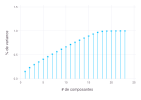

In [239]:
v = cumsum(S.^2) / sum(S.^2)

plot(x=1:length(v), y=v, Geom.point, Geom.hair,
    Guide.xlabel("# de composantes"), 
    Guide.ylabel("% de variance"))

#### 8.7. Calcul de la matrice des composantes principales

In [240]:
T = Z * V;

#### 8.8. Vérification de la colinéarité

Puisque l'objectif de cette technique est de ne pas avoir de multicolinéarité, alors on peut calculer les VIF pour s'en assurer. Ici, on voit que les VIF sont tous à $1$, on peut donc confirmer qu'il n'y a aucune colinéarité puisque les composantes sont orthogonales.

In [241]:
getAllVIF(DataFrame(T, :auto))

Row,Variable,VIF
,String,Float64
1,x1,1.0
2,x2,1.0
3,x3,1.0
4,x4,1.0
5,x5,1.0
6,x6,1.0
7,x7,1.0
8,x8,1.0
9,x9,1.0


#### 8.9. Régression sur l'analyse en composantes principales

Nous allons utiliser notre vecteur $y$ pour estimer les facteurs de régression.

In [242]:
η̂ = T \ y

β̂ = V * η̂;

#### 8.10. Validation du modèle

À l'aide de cette méthode, le RMSE est plus grande qu'aux étapes précédentes. Par conséquent, ce n'est pas concluant.

In [243]:
Ỹ = hcat(ones(nrow(valid)), standardize(Matrix(select(valid, cols))))

ŷ = Ỹ * β̂
rmse = RMSE(ŷ, valid.price)

println("RMSE: $(round(rmse))")

RMSE: 1617.0


### 9. **Méthode 4** : KNN

Nous n'avons pas obtenu de meilleurs résultats avec les deux méthodes précédentes que ceux obtenus avec la régression linéaire simple. Par conséquent, nous avons décidé d'explorer une nouvelle voie : KNN. 

Notre théorie est que les diamants vendus sont standards et se répètent. En outre, en visualisant la taille, nous remarquons des pics, ce qui indique qu'il y a des catégories de taille.

Par conséquent, nous croyons que pour les diamants du fichier de test, nous pourrons trouver des diamants similaires et estimer leur prix à l'aide de la moyenne.

#### 9.1. Chargement des données

In [244]:
data = deepcopy(base_data);
test = deepcopy(base_test);
train = deepcopy(base_train);
valid = deepcopy(base_valid);

#### 9.2. Transformation des valeurs qualitatives

Ici, les valeurs de $cut$ ne sont pas considérées puisqu'elles nuisent au modèle.

In [245]:
convertQualitativeToQuantitative.([train, valid, test], :color)
convertQualitativeToQuantitative.([train, valid, test], :clarity)

color_names = getNamesForQuantitative(train, :color)
clarity_names = getNamesForQuantitative(train, :clarity)

first(train, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z,color: E,color: F,color: G,color: H,color: I,color: J,clarity: IF,clarity: SI1,clarity: SI2,clarity: VS1,clarity: VS2,clarity: VVS1,clarity: VVS2
,Int64,String15?,String1,String7,Float64?,Float64,Int64,Float64,Float64?,Float64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19,0,0,1,0,0,0,0,0,0,0,0,0,1
2,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67,1,0,0,0,0,0,0,0,0,0,0,1,0
3,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71,0,0,1,0,0,0,0,0,0,0,1,0,0
4,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02,0,0,1,0,0,0,0,0,0,0,1,0,0
5,6,Premium,D,VVS2,61.5,60.0,925,4.36,4.42,2.7,0,0,0,0,0,0,0,0,0,0,0,0,1


#### 9.3. Traitement des valeurs manquantes

In [246]:
replaceValuesRegression.([train, valid, test], ignoreCut = true)

first(train, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z,color: E,color: F,color: G,color: H,color: I,color: J,clarity: IF,clarity: SI1,clarity: SI2,clarity: VS1,clarity: VS2,clarity: VVS1,clarity: VVS2
,Int64,String15?,String1,String7,Float64,Float64,Int64,Float64,Float64,Float64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19,0,0,1,0,0,0,0,0,0,0,0,0,1
2,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67,1,0,0,0,0,0,0,0,0,0,0,1,0
3,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71,0,0,1,0,0,0,0,0,0,0,1,0,0
4,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02,0,0,1,0,0,0,0,0,0,0,1,0,0
5,6,Premium,D,VVS2,61.5,60.0,925,4.36,4.42,2.7,0,0,0,0,0,0,0,0,0,0,0,0,1


#### 9.4. Manipulation des données

Pour chaque ensemble, on ne garde que les variables quantitative qui nous intéresse. On ignore $cut$, $table$ et $depth$ puisqu'ils nuisent au modèle.

In [247]:
Mat_train = Matrix(
    standardize(
        select(
            train,
            Not(["price","cut","ID","color","clarity","depth","table"]),
        )
    )
)';

Mat_valid = Matrix(
    standardize(
        select(
            valid,
            Not(["price","cut","ID","color","clarity","depth","table"]),
        )
    )
)';

Mat_test = Matrix(
    standardize(
        select(
            test,
            Not(["cut","ID","color","clarity","depth","table"]),
        )
    )
)';

#### 9.5. Définition de l'arbre KNN

Afin d'implémenter l'algorithme, une méthode de détermination des distances doit être déterminée. 

Pour ce faire, plusieurs distances peuvent être utilisées. Étant donné les données réelles avec lesquelles travaillons, nous avons optés pour les distances de la forme suivante:

$$
\left( \sum_{i}^{n} | x_i - y_i |^p \right) ^{1/p}
$$

Notons que lorsque $p = 1$, ceci équivaut à une distance de Manhattan et lorsque $p =2$, ceci équivaut à une distance Euclidienne.

Par curiosité, dans notre exploration, nous avons testé pour des valeurs de $p$ allant de 0.5 à 2.

On doit aussi définir le nombre de voisins $k$ qu'on cherche à obtenir avec notre distance. Nous avons testé pour des $k$ allant de 1 à 12.

Nos recherches nous ont mené à un minimum utilisant la distance avec un $p = 0.95$ et $k=9$.

Notons que le modèle de Minkowski n'est pas défini pour les valeurs inférieur à 1. Cependant, $p < 1$ est alors une mesure, mais pas une mesure de Minkowski.

In [248]:
# Génération de l'arbre de données et ajout de poids pour les différentes variables
weight = zeros(size(Mat_train, 1))

weight[1:3]   .= 1; # x, y, z
weight[4:9]   .= 1; # color
weight[10:16] .= 1; # clarity

kdtree = KDTree(Mat_train, WeightedMinkowski(weight, 0.95));

#### 9.6. Validation du modèle

Ce modèle nous offre un RMSE nettement amélioré. Nous allons donc l'utiliser pour effectuer nos prédictions.

In [249]:
# Nombre de plus proches voisins à utiliser
k = 9

# Algo knn pour valid
idxs, dists = knn(kdtree, Mat_valid, k, true)

prediction = [
    dot(train.price[idxs[i]], dists[i]) / sum(dists[i])
    for i in 1:size(idxs, 1)
]

rmse = RMSE(prediction, valid.price)

println("RMSE: $(round(rmse))")

RMSE: 647.0


### 10. Choix du modèle et génération du fichier de prédictions

Le modèle knn a finalement finalement été retenu. Ce choix est principalement lié aux faibles valeurs de RMSE obtenues lors de l'estimation des coûts des diamants. Ci-dessous se trouve l'algorithme qui nous a permis d'obtenir les résultats présentés.

1. Les données qualitatives sont transformées en données quantitatives.
2. Les valeurs manquantes (x, y et z) sont remplacées à l'aide d'une régression linéaire effectuée sur les variables non-manquante du diamant.
3. Les colonnes sont standardisées et l'algorithme KNN est appliqué afin d'estimer le coût des diamants.

#### 10.1 Chargement des données

In [250]:
data = deepcopy(base_data);
test = deepcopy(base_test);

#### 10.2 Transformation des valeurs qualitatives

In [251]:
convertQualitativeToQuantitative.([data, test], :color)
convertQualitativeToQuantitative.([data, test], :clarity)

color_names = getNamesForQuantitative(data, :color)
clarity_names = getNamesForQuantitative(data, :clarity)

first(data, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z,color: E,color: F,color: G,color: H,color: I,color: J,clarity: IF,clarity: SI1,clarity: SI2,clarity: VS1,clarity: VS2,clarity: VVS1,clarity: VVS2
,Int64,String15?,String1,String7,Float64?,Float64,Int64,Float64,Float64?,Float64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,1,missing,E,SI2,60.2,60.0,5340,6.46,6.5,3.9,1,0,0,0,0,0,0,0,1,0,0,0,0
2,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19,0,0,1,0,0,0,0,0,0,0,0,0,1
3,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67,1,0,0,0,0,0,0,0,0,0,0,1,0
4,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71,0,0,1,0,0,0,0,0,0,0,1,0,0
5,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02,0,0,1,0,0,0,0,0,0,0,1,0,0


#### 10.3 Traitement des valeurs manquantes

In [252]:
replaceValuesRegression.([data, test], ignoreCut = true)

first(data, 5)

Row,ID,cut,color,clarity,depth,table,price,x,y,z,color: E,color: F,color: G,color: H,color: I,color: J,clarity: IF,clarity: SI1,clarity: SI2,clarity: VS1,clarity: VS2,clarity: VVS1,clarity: VVS2
,Int64,String15?,String1,String7,Float64,Float64,Int64,Float64,Float64,Float64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,1,missing,E,SI2,60.2,60.0,5340,6.46,6.5,3.9,1,0,0,0,0,0,0,0,1,0,0,0,0
2,2,Ideal,G,VVS2,62.7,57.0,1936,5.12,5.05,3.19,0,0,1,0,0,0,0,0,0,0,0,0,1
3,3,Premium,E,VVS1,62.0,59.0,1012,4.33,4.28,2.67,1,0,0,0,0,0,0,0,0,0,0,1,0
4,4,Ideal,G,VS2,61.7,57.0,720,4.41,4.38,2.71,0,0,1,0,0,0,0,0,0,0,1,0,0
5,5,missing,G,VS2,62.4,58.0,6301,6.41,6.48,4.02,0,0,1,0,0,0,0,0,0,0,1,0,0


#### 10.4 Manipulation des données

In [253]:
Mat_data = Matrix(
    standardize(
        select(
            data,
            Not(["price","cut","ID","color","clarity","depth","table"]),
        )
    )
)';

Mat_test = Matrix(
    standardize(
        select(
            test,
            Not(["cut","ID","color","clarity","depth","table"]),
        )
    )
)';

#### 10.5 Définition de l'arbre KNN

In [254]:
# Génération de l'arbre de données et ajout de poids pour les différentes variables
weight = zeros(size(Mat_data,1))

weight[1:3]   .= 1; # x, y, z
weight[3:9]   .= 1; # color
weight[10:16] .= 1; # clarity

kdtree = KDTree(Mat_data, WeightedMinkowski(weight, 0.95))

k=9
idxs, dists = knn(kdtree, Mat_test, k, true);

#### 10.6 Prédictions

In [255]:
prediction = [
    dot(data.price[idxs[i]], dists[i]) / sum(dists[i])
    for i in 1:size(idxs, 1)
]

CSV.write("prediction.csv", DataFrame(ID=test.ID, price = prediction))

"prediction.csv"

### 11. Conclusion

Un modèle de prédiction du prix de diamants à partir de l'algorithme KNN a été sélectionné suite à l'exploration de plusieurs autres modèles, comme la régression linéaire et l'analyse en composante principale. Le RMSE plus faible obtenu avec KNN nous a finalement orienté vers le choix de ce dernier. Afin de diminuer davatange la taille des erreurs obtenues, les valeurs manquantes et nulles ont été remplacées par des estimations issues d'une régression linéaire. Plusieurs variables explicatives ont été ignorées à la suite d'une analyse exploratoire initiale et des résultats obtenus (coupe, table et profondeur).

#### 11.1. Pistes ignorées

1. Nous avions pensé à regrouper certaines classes ensemble. Par exemple, pour la clarté, nous avions pensé, puisque certaines catégories sont colinéaires, que nous pourrions les regrouper. Cependant, lorsque nous avons décidé d'explorer l'analyse en composantes principales et KNN, nous nous sommes dit que ce n'était pas nécessaire.

2. Lorsqu'on a fait un histogramme avec la taille, nous avons remarqué qu'il semblait y avoir plusieurs pics de données. Nous avons estimé que c'est possible qu'il y ait des catégories de taille plutôt que des tailles spécifiques de diamant. Cependant, ça ne semblait pas nécessaire avec notre avenue finale (KNN), donc nous n'avons pas continué avec cette idée.

3. Pour KNN, nous voulions utiliser 2 modèles KNN différents pour les entrées avec un $y$ et les entrées sans. Cependant, cette technique était beaucoup plus lourde sur le code et nous obtenions les mêmes résultats qu'avec les estimations par régression fait précédemment. Nous pensions que nous pourrions diminuer l'incertitude de nos prédictions, cependant, puisque $y$ est très corrélé, l'estimation par régression n'a pas une grande incertitude. C'est pourquoi nous pensons que le résultat est le même.

4. La variable $depth$ a des propriétés intéressantes : comme le calcul se fait avec les dimensions et qu'il s'agit d'un ratio de variables à forte corrélation linéaire, il est normal que le résultat du calcul se rapproche d'une valeur fixe pour tous les diamants. Dans nos démarches, nous avons supposé que $depth$ n'avait pas d'impact sur le prix du diamant. Toutefois, il n'est pas impossible qu'une valeur spécifique sur l'étendue des valeurs de cette variable optimise les qualités optiques d'un diamant, ce qui mènerait à une hausse du prix. Cette avenue est tout de même ignorée dans le présent rapport.

#### 11.2. À améliorer

1. Pour KNN, nous avons ignoré les variables $cut$, $table$ et $depth$. Cependant, pour la régression, la variables $cut$ était significative et contribuait au modèle. Il serait intéressant de comprendre pourquoi en KNN ce n'est pas le cas et si ça serait possible d'améliorer notre modèle en l'utilisant d'une autre manière.